<a href="https://colab.research.google.com/github/dominiquebuford/CV_project3/blob/dombuford/run_cGAN_CV3_finalversion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# set up access to Kaggle API
!pip install -q kaggle
from google.colab import files
files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json


Saving kaggle.json to kaggle.json
kaggle.json


In [2]:
import pandas as pd
!pip install -q --upgrade torch_snippets
from torch_snippets import *
device = "cuda" if torch.cuda.is_available() else "cpu"
from torchvision.utils import make_grid
from torch_snippets import *
from PIL import Image
import torchvision
from torchvision import transforms
import torchvision.utils as vutils

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 998.8 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.2/204.2 kB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 32.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.9/98.9 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 33.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.8/30.8 MB 29.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.4/177.4 kB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 35.6 MB/s eta

In [3]:
#!kaggle datasets download -d yuulind/imdb-clean
#!unzip imdb-clean.zip
!kaggle datasets download -d jangedoo/utkface-new
!unzip utkface-new

Streaming output truncated to the last 5000 lines.
  inflating: utkface_aligned_cropped/crop_part1/34_1_0_20170109004755204.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_0_20170111182452832.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_1_20170103230340961.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_1_20170104011329697.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_1_20170104165020320.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_1_20170108230211421.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_2_20170104022134829.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_2_20170104023010725.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_2_20170104172537171.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_2_20170104201443273.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_2_20170104204327

In [ ]:
#df = pd.read_csv('imdb_train_new_1024.csv')

In [ ]:
 #age range 1-95
age_categories = {
    'age_1_20': range(1, 21),
    'age_21_40': range(21, 41),
    'age_41_60': range(41, 61),
    'age_61_80': range(61, 81),
    'age_81_100': range(81, 101)
}

# Initialize an empty DataFrame to store one-hot encoded values
df_encoded = df.loc[:, ['filename', 'gender', 'x_min', 'y_min', 'x_max', 'y_max']].copy()

# One-hot encode the 'age' column based on custom age categories
for category, age_range in age_categories.items():
    df_encoded[category] = df['age'].apply(lambda x: 1 if x in age_range else 0)


#calculate height,width for crop
df_encoded['height'] = df_encoded['y_max'] - df_encoded['y_min']
df_encoded['width'] = df_encoded['x_max'] - df_encoded['x_min']


In [ ]:
df_encoded


,filename,gender,x_min,y_min,x_max,y_max,age_1_20,age_21_40,age_41_60,age_61_80,age_81_100
0,05/nm0200005_rm3512895744_1959-12-24_2009.jpg,M,78.0,93.0,155.0,185.0,0,0,1,0,0
1,02/nm0001002_rm1464638208_1966-7-31_2006.jpg,M,123.0,175.0,245.0,349.0,0,1,0,0,0
2,00/nm0000100_rm103389184_1955-1-6_2005.jpg,M,52.0,70.0,103.0,139.0,0,0,1,0,0
3,04/nm0024404_rm2909178368_1978-2-20_2009.jpg,F,28.0,38.0,55.0,75.0,0,1,0,0,0
4,00/nm0703800_rm31823616_1959-6-6_2008.jpg,M,69.0,100.0,137.0,199.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
183882,92/nm0000792_rm1388288256_1959-3-6_1996.jpg,M,47.0,56.0,93.0,111.0,0,1,0,0,0
183883,95/nm2933395_rm2089976320_1978-5-4_2005.jpg,F,45.0,58.0,89.0,115.0,0,1,0,0,0
183884,97/nm0504897_rm3787293952_1962-6-27_1997.jpg,M,372.0,341.0,650.0,681.0,0,1,0,0,0
183885,97/nm0136797_rm1485021184_1962-8-16_2013.jpg,M,226.0,311.0,451.0,621.0,0,0,1,0,0


In [4]:
import os

In [ ]:
!mkdir cropped_faces_female
!mkdir cropped_faces_male

paths = df_encoded['filename'].tolist()
x_mins = df_encoded['x_min'].tolist()
y_mins = df_encoded['y_min'].tolist()
heights = df_encoded['height'].tolist()
widths = df_encoded['width'].tolist()

original_folder = 'imdb-clean-1024/imdb-clean-1024'
for i in range(len(paths)):
  y = int(y_mins[i])
  x = int(x_mins[i])
  h = int(heights[i])
  w = int(widths[i])
  fullName = os.path.join(original_folder, paths[i])
  img = read(fullName, 1)
  img2 = img[y:(y+h),x:(x+w),:]

  finalImageName =''
  if df_encoded.loc[i, 'gender'] == 'M':
    finalImageName += 'cropped_faces_male/'
  else:
    finalImageName+='cropped_faces_female/'
  if df_encoded.loc[i, 'age_1_20'] == 1:
    finalImageName+= 'age_1_20_'
  elif df_encoded.loc[i, 'age_21_40'] ==1:
    finalImageName+='age_21_40_'
  elif df_encoded.loc[i, 'age_41_60'] ==1:
    finalImageName+='age_41_60_'
  elif df_encoded.loc[i, 'age_61_80'] ==1:
    finalImageName+='age_61_80_'
  else:
    finalImageName+='age_81_100'

  cv2.imwrite(finalImageName+str(i)+'.jpg',cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))



In [5]:
class AddNoise(object):
    def __init__(self, noise_level):
        self.noise_level = noise_level

    def __call__(self, img):
        noise = torch.randn_like(img) * self.noise_level
        noisy_img = img + noise
        return noisy_img

In [6]:
transform=transforms.Compose([
                               transforms.Resize(64),
                               transforms.CenterCrop(64),
                               transforms.ToTensor(),
                               AddNoise(noise_level = 0.1),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])

In [31]:
transform_no_noise = transforms.Compose([
                               transforms.Resize(64),
                               transforms.CenterCrop(64),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])

In [42]:
class Faces(Dataset):
    def __init__(self, folders):
        super().__init__()
        #self.folderfemale = folders[0]
        #self.foldermale = folders[1]
        #self.images=sorted(Glob(self.folderfemale))+sorted(Glob(self.foldermale))
        self.images = sorted(Glob(folders[0]))
        self.age_categories = {
        'age_1_20': range(1, 21),
        'age_21_40': range(21, 41),
        'age_41_60': range(41, 61),
        'age_61_80': range(61, 81),
        'age_81_100': range(81, 101)
    }
    def __len__(self):
        return len(self.images)
    def __getitem__(self, ix):
        image_path = self.images[ix]
        image = Image.open(image_path)
        image_noise = transform(image)
        image_no_noise = transform_no_noise(image)
        gender = np.where('female' in str(image_path),1,0)
        last_path = str(image_path).split('/')[-1]
        age = int(last_path.split('_')[0])
        #grab the age label as well
        age_label = np.argmax([age in age_range for label, age_range in self.age_categories.items()])
        return image_no_noise, image_noise, torch.tensor(gender).long(), torch.tensor(age_label).long()

In [43]:
ds = Faces(folders=['UTKFace'])
dataloader = DataLoader(ds, batch_size=30, shuffle=True, num_workers=8, drop_last=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [9]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [10]:
class Discriminator(nn.Module):
    def __init__(self, emb_size=32):
        super(Discriminator, self).__init__()
        self.emb_size = 32
        self.gender_label_embeddings = nn.Embedding(2, self.emb_size)
        self.age_label_embeddings = nn.Embedding(5, self.emb_size)
        self.model = nn.Sequential(
            nn.Conv2d(3,64,4,2,1,bias=False),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64,64*2,4,2,1,bias=False),
            nn.BatchNorm2d(64*2),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*2,64*4,4,2,1,bias=False),
            nn.BatchNorm2d(64*4),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*4,64*8,4,2,1,bias=False),
            nn.BatchNorm2d(64*8),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*8,64,4,2,1,bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Flatten()
        )
        self.model2 = nn.Sequential(
            nn.Linear(320,100),   #image size is 64 x 2 x 2 + 64 (the two label embeddings) = 320
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(100,1),
            nn.Sigmoid()
        )
        self.apply(weights_init)
    def forward(self, input, gender_labels, age_labels):
        x = self.model(input)
        y = self.gender_label_embeddings(gender_labels)
        z = self.age_label_embeddings(age_labels)
        input = torch.cat([x, y, z], 1)
        final_output = self.model2(input)
        return final_output

In [21]:
class Generator(nn.Module):
    def __init__(self, emb_size=32):
        super(Generator,self).__init__()
        self.emb_size = emb_size
        self.gender_label_embeddings = nn.Embedding(2, self.emb_size)
        self.age_label_embeddings = nn.Embedding(5, self.emb_size)
        self.model = nn.Sequential(
            # Downsample layers
            nn.Conv2d(3 + (2 * self.emb_size), 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # Upsample layers
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )
        self.apply(weights_init)
    def forward(self,input,gender_labels, age_labels):
        gender_label_embeddings = self.gender_label_embeddings(gender_labels).view(len(gender_labels), self.emb_size, 1, 1)
        age_label_embeddings = self.age_label_embeddings(age_labels).view(len(age_labels), self.emb_size, 1, 1)

        gender_label_embeddings = gender_label_embeddings.repeat(1, 1, 64, 64)  # shape: batch_size x emb_size x 64 x 64
        age_label_embeddings = age_label_embeddings.repeat(1, 1, 64, 64)

        input = torch.cat([input, gender_label_embeddings, age_label_embeddings], 1)
        return self.model(input)

In [12]:
def noise(size):
    n = torch.randn(size, 512, 1, 1, device=device)
    return n.to(device)

In [13]:
def discriminator_train_step(real_data, real_gender_labels, real_age_labels, fake_data, fake_gender_labels, fake_age_labels):
    d_optimizer.zero_grad()
    prediction_real = discriminator(real_data, real_gender_labels, real_age_labels)
    error_real = loss(prediction_real, torch.ones(len(real_data), 1).to(device))
    error_real.backward()
    prediction_fake = discriminator(fake_data, fake_gender_labels, fake_age_labels)
    error_fake = loss(prediction_fake, torch.zeros(len(fake_data), 1).to(device))
    error_fake.backward()
    d_optimizer.step()
    return error_real + error_fake

In [45]:
def compute_identity_loss(fake_output, real_data):
    # Compute mean absolute error (MAE) between fake output and real data
    identity_loss = F.l1_loss(fake_output, real_data)
    return identity_loss

In [46]:
def generator_train_step(fake_data, real_data, fake_gender_labels, fake_age_labels):   #added real_data
    g_optimizer.zero_grad()
    prediction = discriminator(fake_data, fake_gender_labels, fake_age_labels)
    error = loss(prediction, torch.ones(len(fake_data), 1).to(device))
    identity_loss = compute_identity_loss(fake_data, real_data)
    total_loss = error + (identity_loss *2)
    total_loss.backward()
    g_optimizer.step()
    return error

In [52]:
discriminator = Discriminator().to(device)
generator = Generator().to(device)
loss = nn.BCELoss()
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.001, betas=(0.5, 0.999))
g_optimizer = optim.Adam(generator.parameters(), lr=0.0001, betas=(0.5, 0.999), weight_decay = 0.0005)
fixed_noise = torch.randn(30, 512, 1, 1, device=device)
fixed_fake_gender_labels = torch.LongTensor([0]*(len(fixed_noise)//2) + [1]*(len(fixed_noise)//2)).to(device)
fixed_fake_age_labels = torch.LongTensor([0]*(len(fixed_noise)//5) + [1]*(len(fixed_noise)//5) + [2]*(len(fixed_noise)//5) + [3]*(len(fixed_noise)//5) + [4]*(len(fixed_noise)//5)).to(device)
loss = nn.BCELoss()
n_epochs = 25
img_list = []

EPOCH: 1.000  g_loss: 23.687  d_loss: 0.157  (71.39s - 1713.27s remaining)


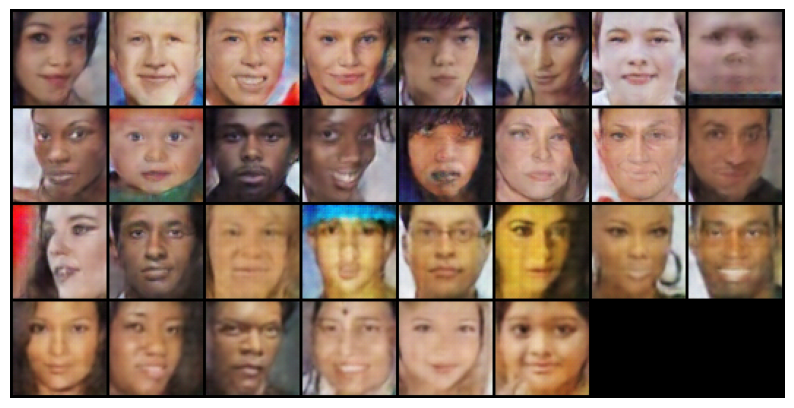

EPOCH: 2.000  g_loss: 24.807  d_loss: 0.141  (142.12s - 1634.39s remaining)


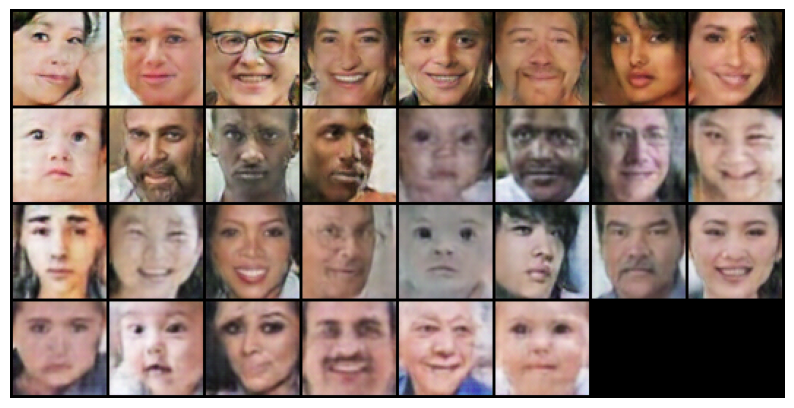

EPOCH: 3.000  g_loss: 22.653  d_loss: 0.165  (212.46s - 1558.03s remaining)


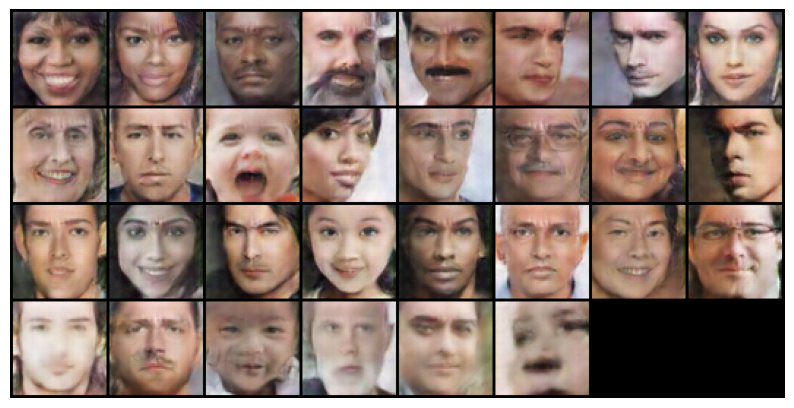

EPOCH: 4.000  g_loss: 23.493  d_loss: 0.149  (284.05s - 1491.27s remaining)


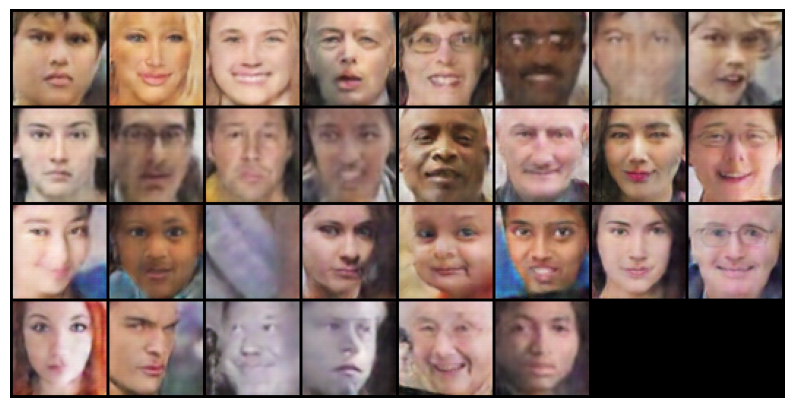

EPOCH: 5.000  g_loss: 23.773  d_loss: 0.163  (359.95s - 1439.78s remaining)


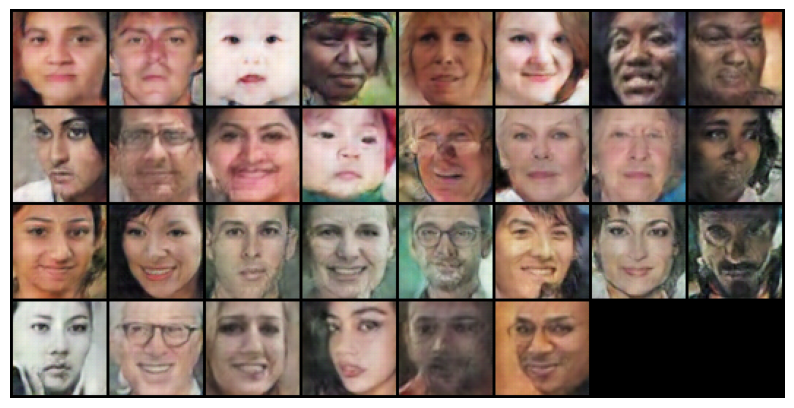

EPOCH: 6.000  g_loss: 23.267  d_loss: 0.139  (437.51s - 1385.43s remaining)


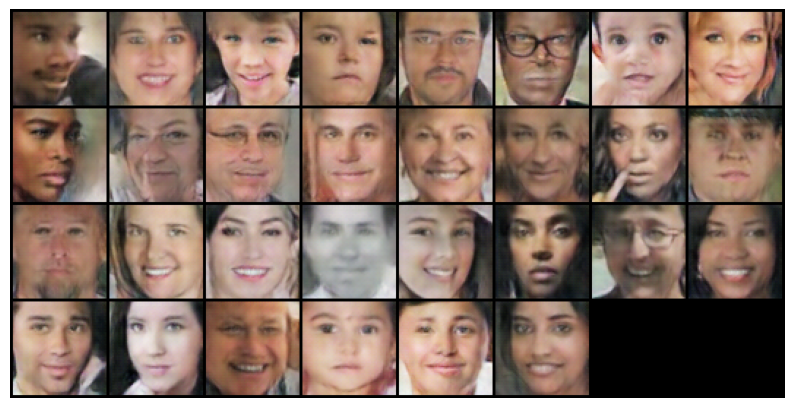

EPOCH: 7.000  g_loss: 24.723  d_loss: 0.142  (513.65s - 1320.81s remaining)


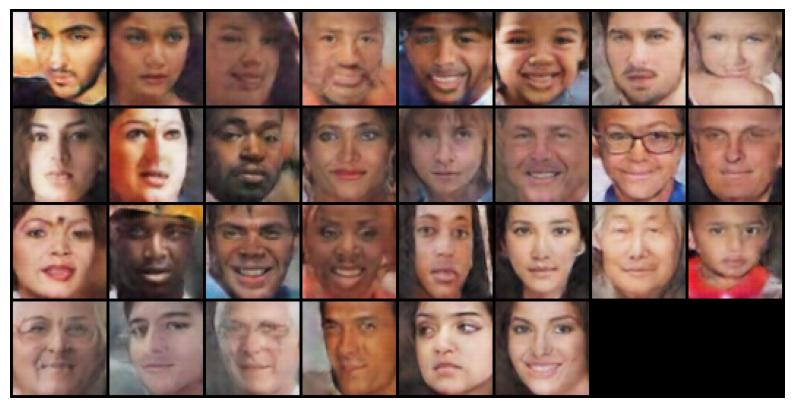

EPOCH: 8.000  g_loss: 24.885  d_loss: 0.132  (591.57s - 1257.09s remaining)


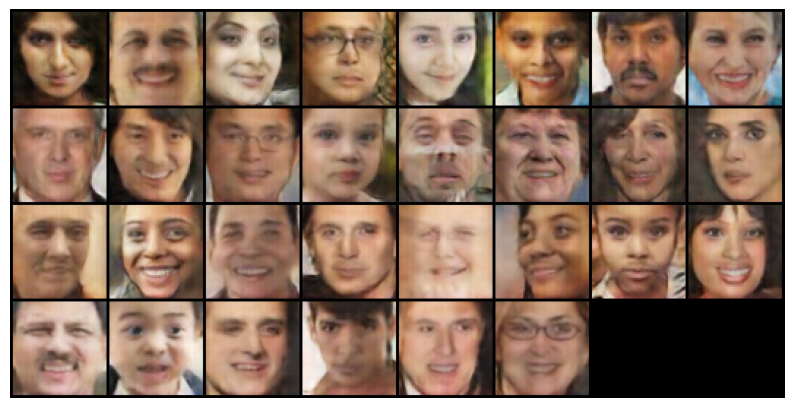

EPOCH: 9.000  g_loss: 23.119  d_loss: 0.152  (675.17s - 1200.31s remaining)


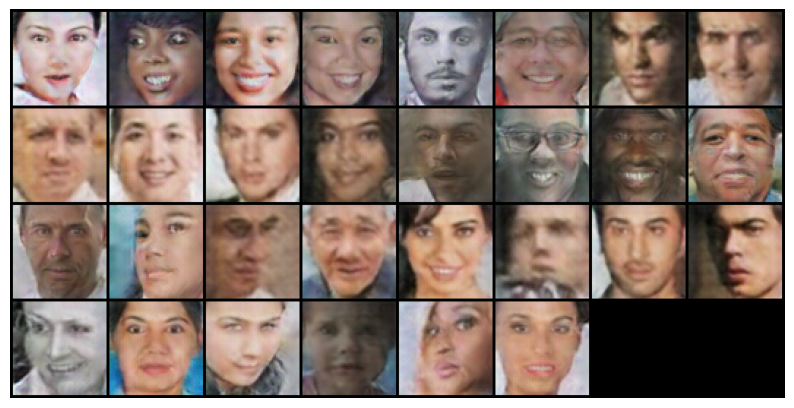

EPOCH: 10.000  g_loss: 23.224  d_loss: 0.136  (758.09s - 1137.13s remaining)


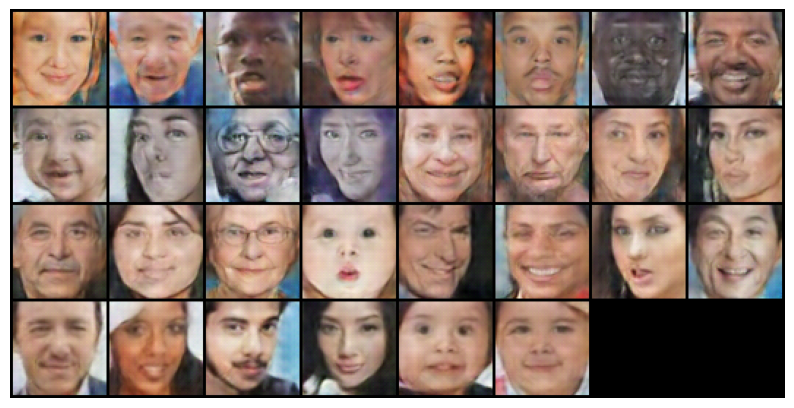

EPOCH: 11.000  g_loss: 23.731  d_loss: 0.125  (843.40s - 1073.42s remaining)


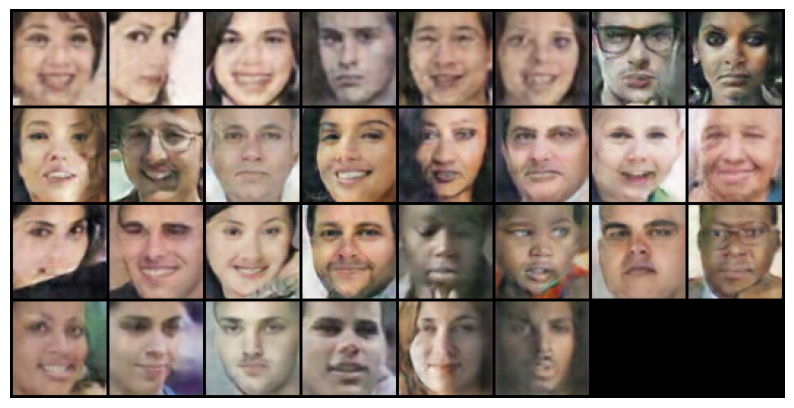

EPOCH: 12.000  g_loss: 23.805  d_loss: 0.134  (927.93s - 1005.26s remaining)


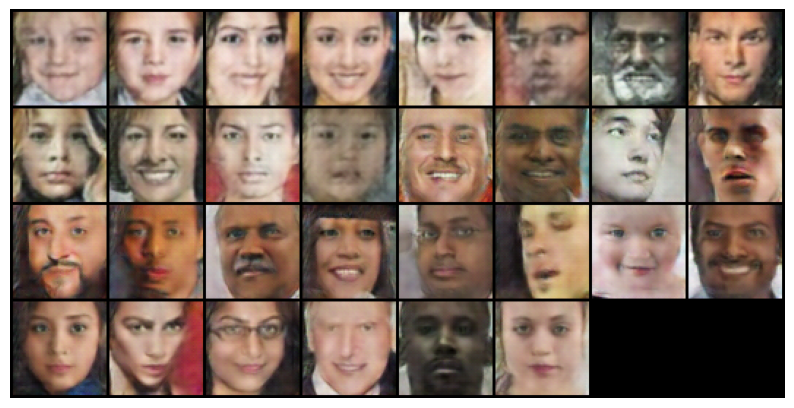

EPOCH: 13.000  g_loss: 25.209  d_loss: 0.119  (1012.90s - 934.99s remaining)


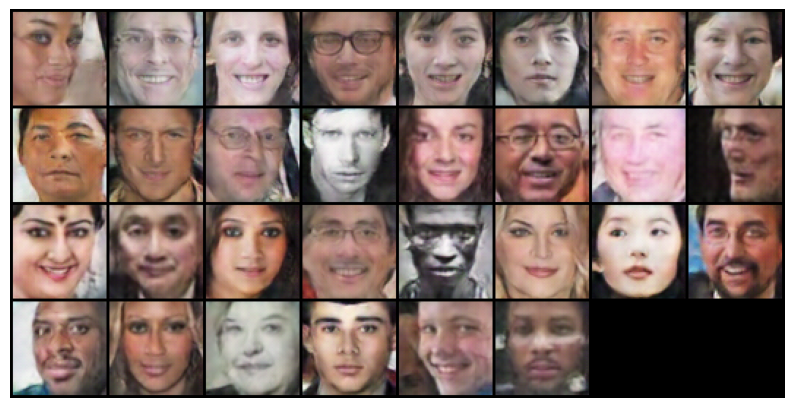

EPOCH: 14.000  g_loss: 23.160  d_loss: 0.144  (1107.23s - 869.97s remaining)


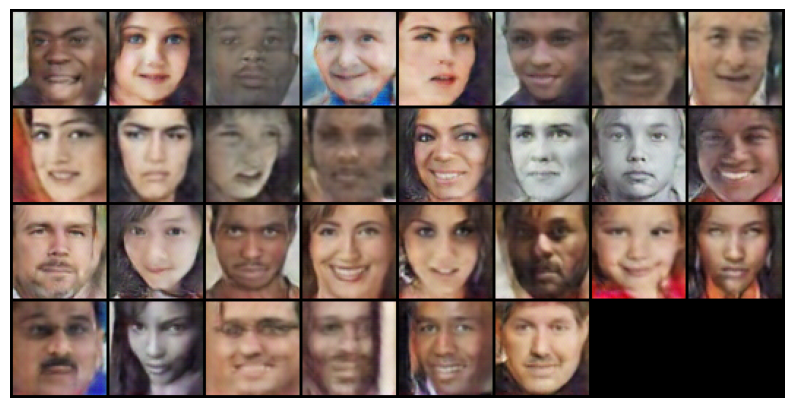

EPOCH: 15.000  g_loss: 23.122  d_loss: 0.126  (1198.66s - 799.11s remaining)


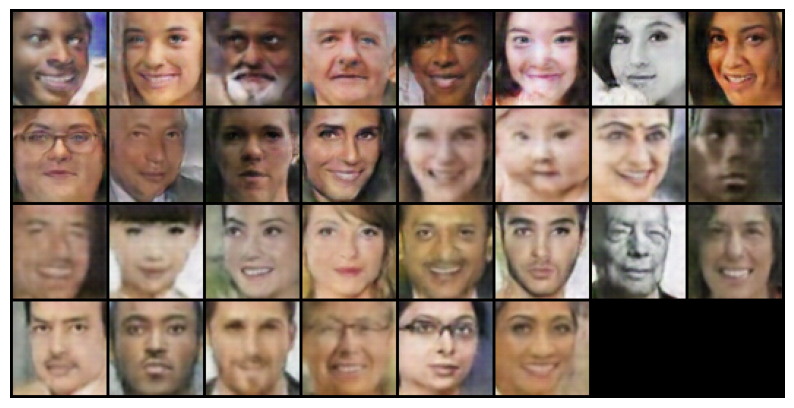

EPOCH: 16.000  g_loss: 23.830  d_loss: 0.128  (1292.16s - 726.84s remaining)


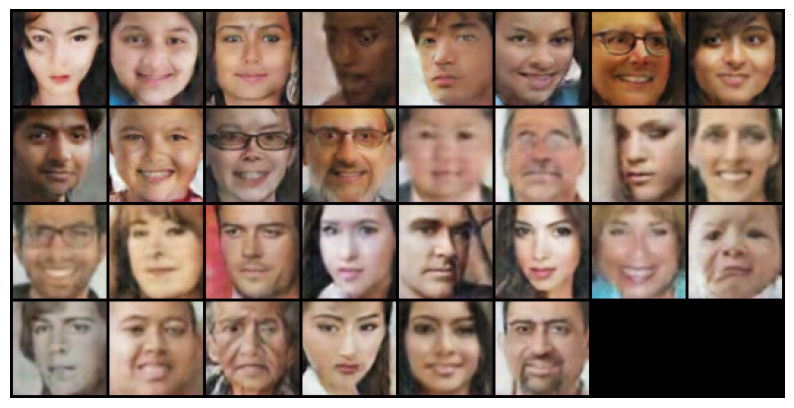

EPOCH: 17.000  g_loss: 24.388  d_loss: 0.114  (1387.91s - 653.13s remaining)


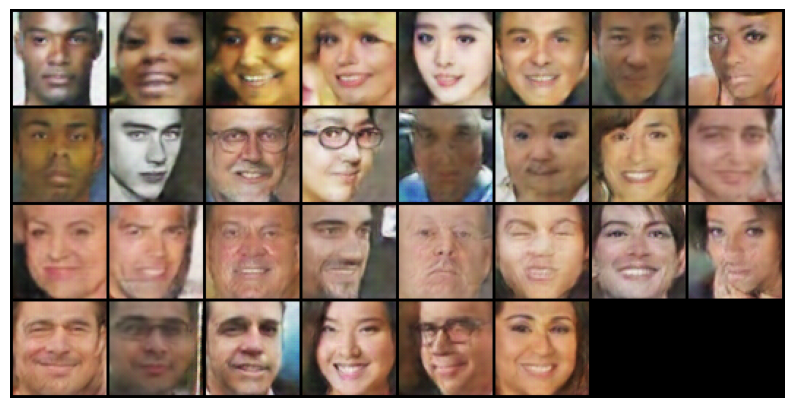

EPOCH: 18.000  g_loss: 24.682  d_loss: 0.121  (1487.39s - 578.43s remaining)


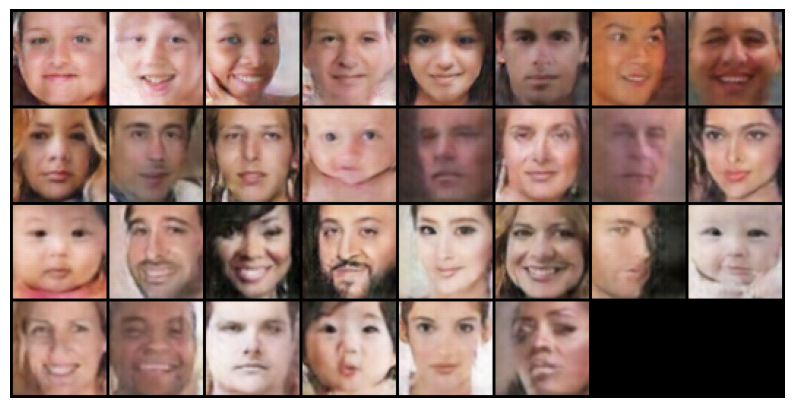

EPOCH: 19.000  g_loss: 23.605  d_loss: 0.125  (1589.11s - 501.83s remaining)


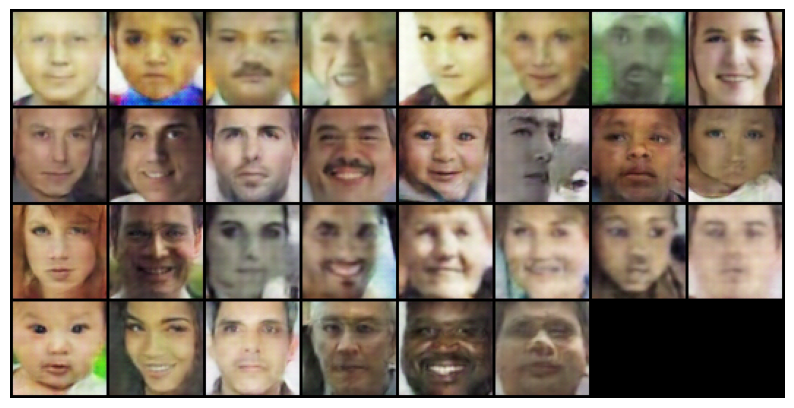

EPOCH: 20.000  g_loss: 25.389  d_loss: 0.095  (1692.26s - 423.06s remaining)


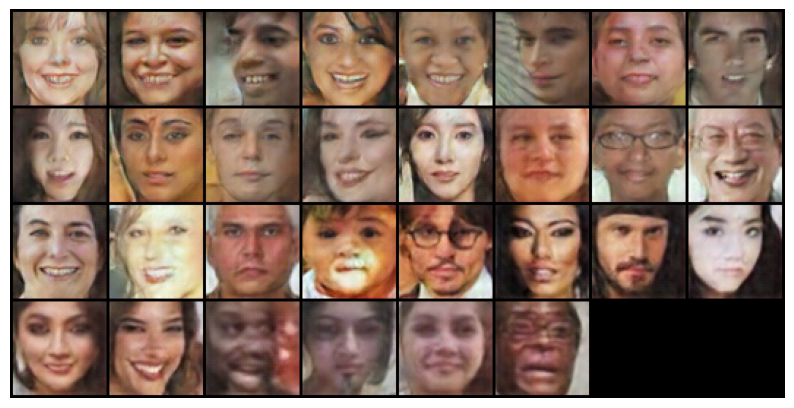

EPOCH: 21.000  g_loss: 23.353  d_loss: 0.109  (1795.38s - 341.98s remaining)


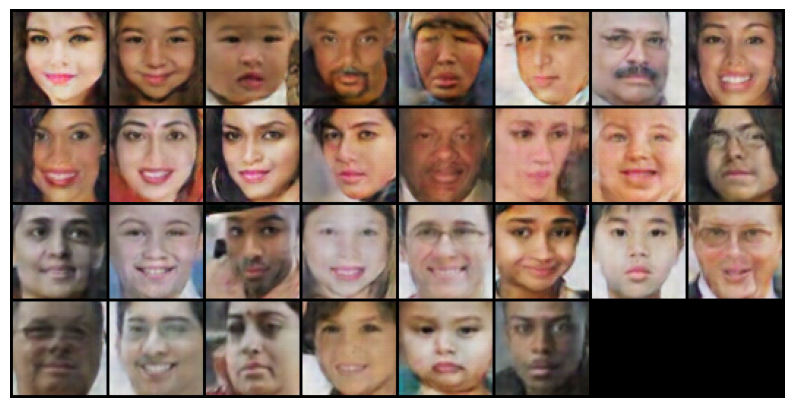

EPOCH: 22.000  g_loss: 23.897  d_loss: 0.110  (1898.05s - 258.83s remaining)


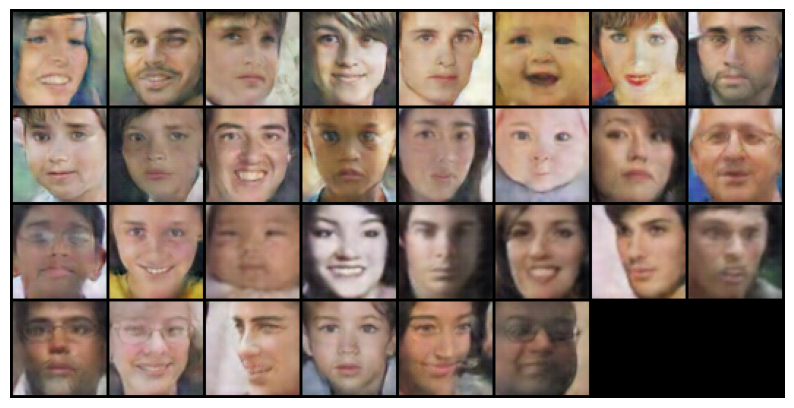

EPOCH: 23.000  g_loss: 23.551  d_loss: 0.100  (2000.86s - 173.99s remaining)


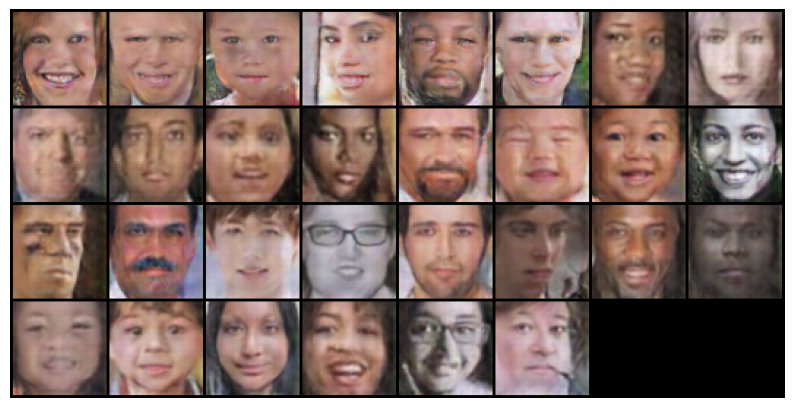

EPOCH: 24.000  g_loss: 21.667  d_loss: 0.121  (2104.33s - 87.68s remaining)


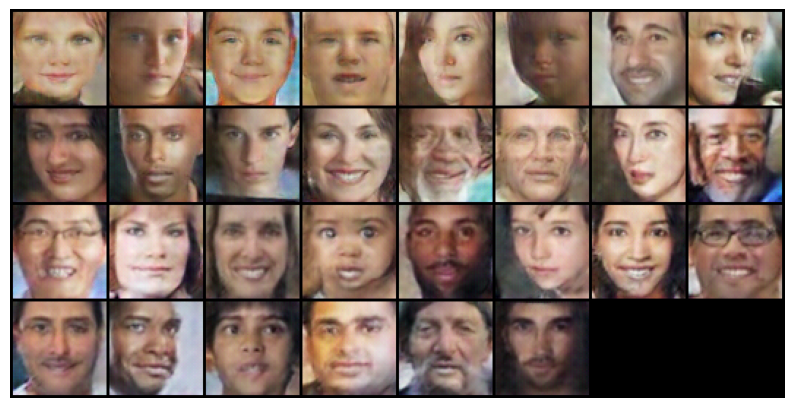

EPOCH: 25.000  g_loss: 22.798  d_loss: 0.111  (2207.28s - 0.00s remaining)


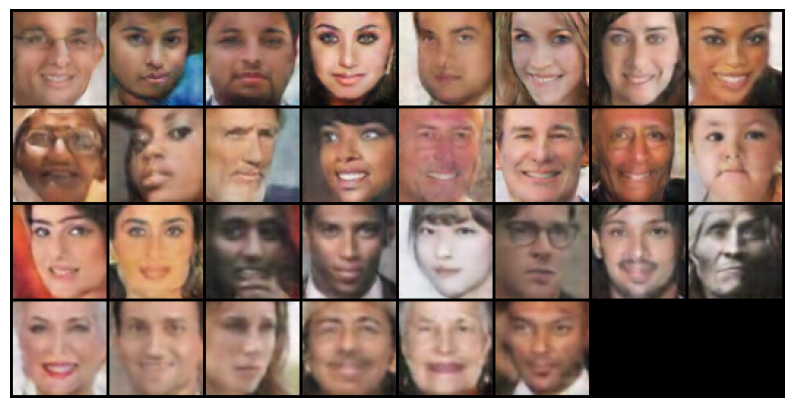

In [60]:
log = Report(n_epochs)
for epoch in range(n_epochs):
    N = len(dataloader)
    for bx, (images,noisy_images, gender_labels, age_labels) in enumerate(dataloader):
        real_data, noisy_data, real_gender_labels, real_age_labels = images.to(device), noisy_images.to(device),gender_labels.to(device), age_labels.to(device)
        fake_gender_labels = torch.LongTensor(np.random.randint(0, 2, len(real_data))).to(device)
        fake_age_labels = torch.LongTensor(np.random.randint(0, 5, len(real_data))).to(device)
        fake_data = generator(noisy_data, fake_gender_labels, fake_age_labels)
        fake_data = fake_data.detach()
        d_loss = discriminator_train_step(real_data, real_gender_labels,real_age_labels, fake_data, fake_gender_labels, fake_age_labels)
        fake_gender_labels = torch.LongTensor(np.random.randint(0, 2, len(real_data))).to(device)
        fake_age_labels = torch.LongTensor(np.random.randint(0, 5, len(real_data))).to(device)

        fake_data = generator(noisy_data, fake_gender_labels, fake_age_labels).to(device)
        g_loss = generator_train_step(fake_data, real_data, fake_gender_labels, fake_age_labels)
        pos = epoch + (1+bx)/N
        log.record(pos, d_loss=d_loss.detach(), g_loss=g_loss.detach(), end='\r')
    log.report_avgs(epoch+1)
    with torch.no_grad():
        fake = generator(noisy_data, fixed_fake_gender_labels, fixed_fake_age_labels).detach().cpu()
        imgs = vutils.make_grid(fake, padding=2, normalize=True).permute(1,2,0)
        img_list.append(imgs)
        show(imgs, sz=10)

In [59]:
#have to figure out how to introduce more diversity into the generator

23708

In [67]:
torch.save(generator.state_dict(), 'generator_weights.pth')

torch.Size([1, 3, 64, 64])

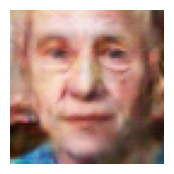

In [66]:
generator.eval()
with torch.no_grad():
  image = Image.open('/content/UTKFace/16_0_0_20170110231527285.jpg.chip.jpg')
  image = transform(image)


  image = image.unsqueeze(0)
  print(image.shape)
  fake_gender_labels = torch.LongTensor(np.random.randint(0, 1, len(image))).to(device)
  fake_age_labels = torch.LongTensor(np.random.randint(4, 5, len(image))).to(device)
  img_list = []
  generator= generator.to(device)
  fake_data = generator(image.to(device), fake_gender_labels, fake_age_labels)
  fake_data = fake_data.detach()


  imgs = vutils.make_grid(fake_data, padding=2, normalize=True).permute(1,2,0)
  img_list.append(imgs)
  show(imgs, sz=2)